# MULTIVARIATE FORECASTING WITH RECURRENT NEURAL NETWORKS

FILENAME: Analysis Notebook.ipynb
    
PROJECT: Multivariate Financial Forecasting

DATE CREATED:24-APR-20

DATE UPDATED:24-APR-20

TASK: Develop and implement a recurrent neural network
    
PURPOSE: Given a multivariate dataset, forecast and predict the corresponding response value for each record

INTENT: The purpose of this project is to conduct exploratory analysis of the provided data set and apply both supervised and unsupervised algorithms in order to extract meaniningful information in support for future open source analysis. The project is broken down into two separate projects, with each project having four (4) distinct phases:

PROJECT: Randomized Budget Data

1. Environment Setup 

2. Data ETL

3. Data Exploration

4. Model Development

Create randomm arrays to store the test values:


3. YEAR +3: yr3_forecast

4. YEAR +2: yr2_forecast

5. YEAR +1: yr1_forecast

6. YEAR +0: plan

7. YEAR -1: approp

8. YEAR -2: obligate

# PROJECT APPLICATION: BUDGET ANALYSIS

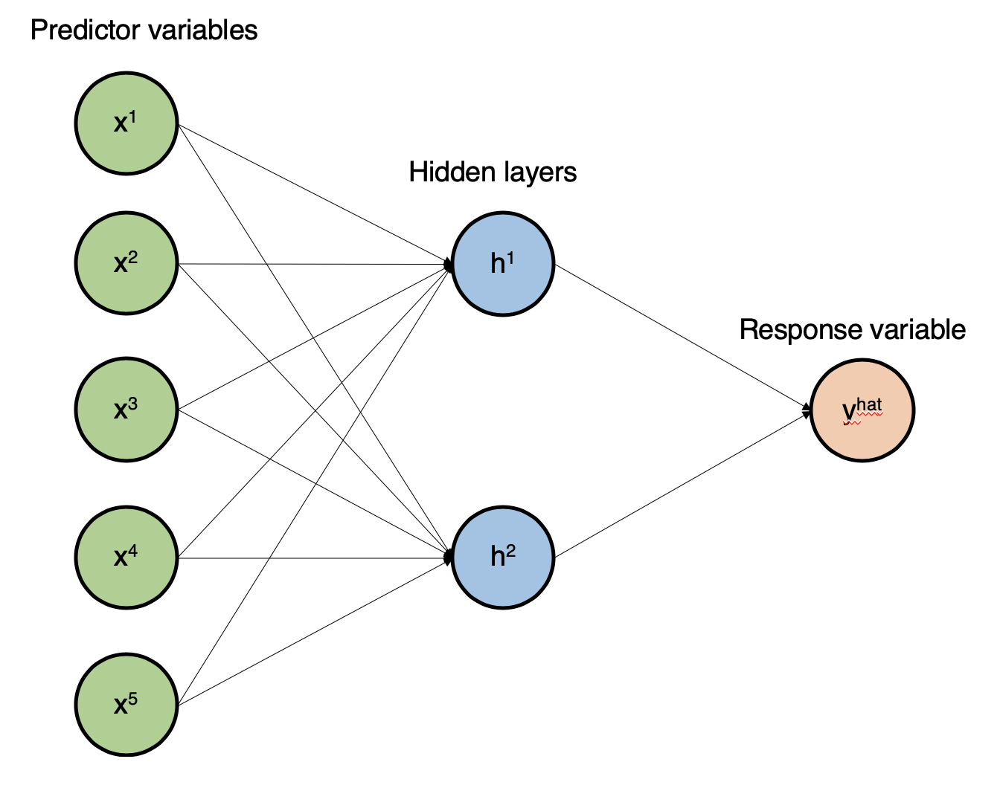

In [87]:

from IPython.display import Image
from IPython.core.display import HTML 
Image(filename = "data/rnn.png", width=750, height=750)

## PHASE 1: PROJECT SETUP

In [88]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [89]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
import time as t
import getpass as gp

Visualization libraries

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

Import the required ML & neural net libraries

In [91]:
from scipy import stats

import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense
from tensorflow.python.keras.wrappers.scikit_learn import KerasRegressor

In [92]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    length = df_length
    yr3_forecast= np.random.randint(low = 100000, high = 30000000, size = df_length) 
    
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df


Start the project timer

In [93]:
program_start = t.time()

Set the random seed for the project in order to ensure consistent results

In [94]:
random.seed(6)

# PHASE 2: DATA ETL

Create random arrays to store the randomized values:

1. YEAR +3: yr3_forecast
2. YEAR +2: yr2_forecast
3. YEAR +1: yr1_forecast
4. YEAR +0: plan
5. YEAR -1: approp
6. YEAR -2: obligate

Create the training array

In [121]:
train_df = init_array(10000)
train_df.tail(10)

,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,3376587,2833733.78,2604369.16,1666140.42,1132291.07,927765.46
9991,8426116,10006954.18,11933485.31,7626690.85,8482777.36,7544962.11
9992,23131966,24884903.23,22340985.68,24584985.42,19186175.35,16250047.89
9993,20384958,14892118.25,13913393.35,8706520.31,6541673.07,6361995.77
9994,28076203,18362295.67,19639899.13,16211040.80,13974118.13,11982109.88
9995,13381157,10411051.73,10446909.20,7123963.15,8527461.32,7515646.41
9996,27683495,29320236.20,33409393.03,41287107.36,43924808.59,43204618.33
9997,26037497,33449390.73,37460188.81,34371138.43,36853130.17,34236451.27
9998,17727569,10559915.85,9084180.60,9704387.49,10200922.75,8883617.64
9999,4385383,5530287.06,5850687.87,7116684.49,7650512.44,7195644.65


In [128]:
train_df.head(5)

,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
0,22438798,17892747.69,20356185.96,20931068.43,19109162.11,16702932.52
1,24942196,17575309.75,17438796.83,18220947.20,17488764.33,14542194.06
2,16909495,9447209.99,7671825.14,4824629.62,4994584.87,4457606.48
3,8495664,8752012.25,10469180.99,11508882.22,7633164.24,6410456.99
4,12499542,10078932.01,11602538.29,11421863.71,9363269.17,8676649.14


In [122]:
col_list = list(train_df.columns)
col_list

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

# PHASE 3: DATA EXPLORATION

In [123]:
dataset = train_df.copy()
dataset.tail(10)

,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,3376587,2833733.78,2604369.16,1666140.42,1132291.07,927765.46
9991,8426116,10006954.18,11933485.31,7626690.85,8482777.36,7544962.11
9992,23131966,24884903.23,22340985.68,24584985.42,19186175.35,16250047.89
9993,20384958,14892118.25,13913393.35,8706520.31,6541673.07,6361995.77
9994,28076203,18362295.67,19639899.13,16211040.80,13974118.13,11982109.88
9995,13381157,10411051.73,10446909.20,7123963.15,8527461.32,7515646.41
9996,27683495,29320236.20,33409393.03,41287107.36,43924808.59,43204618.33
9997,26037497,33449390.73,37460188.81,34371138.43,36853130.17,34236451.27
9998,17727569,10559915.85,9084180.60,9704387.49,10200922.75,8883617.64
9999,4385383,5530287.06,5850687.87,7116684.49,7650512.44,7195644.65


In [124]:
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)

y3 = dataset['yr+3_forecast']
y2 = dataset['yr+2_forecast']
y1 = dataset['yr+1_forecast']
plan = dataset['yr0_plan']
approp = dataset['yr-1_approp']
oblig = dataset['yr-2_oblig']

fig = go.Figure()

fig.add_trace(go.Box(x=y2, name = "yr+3_forecast"))
fig.add_trace(go.Box(x=y3, name = "yr+2_forecast"))
fig.add_trace(go.Box(x=y1, name = "yr+1_forecast"))
fig.add_trace(go.Box(x=plan, name = "yr0_plan"))
fig.add_trace(go.Box(x=approp, name = "yr-1_approp"))
fig.add_trace(go.Box(x=oblig, name = "yr-2_oblig"))
fig.show()

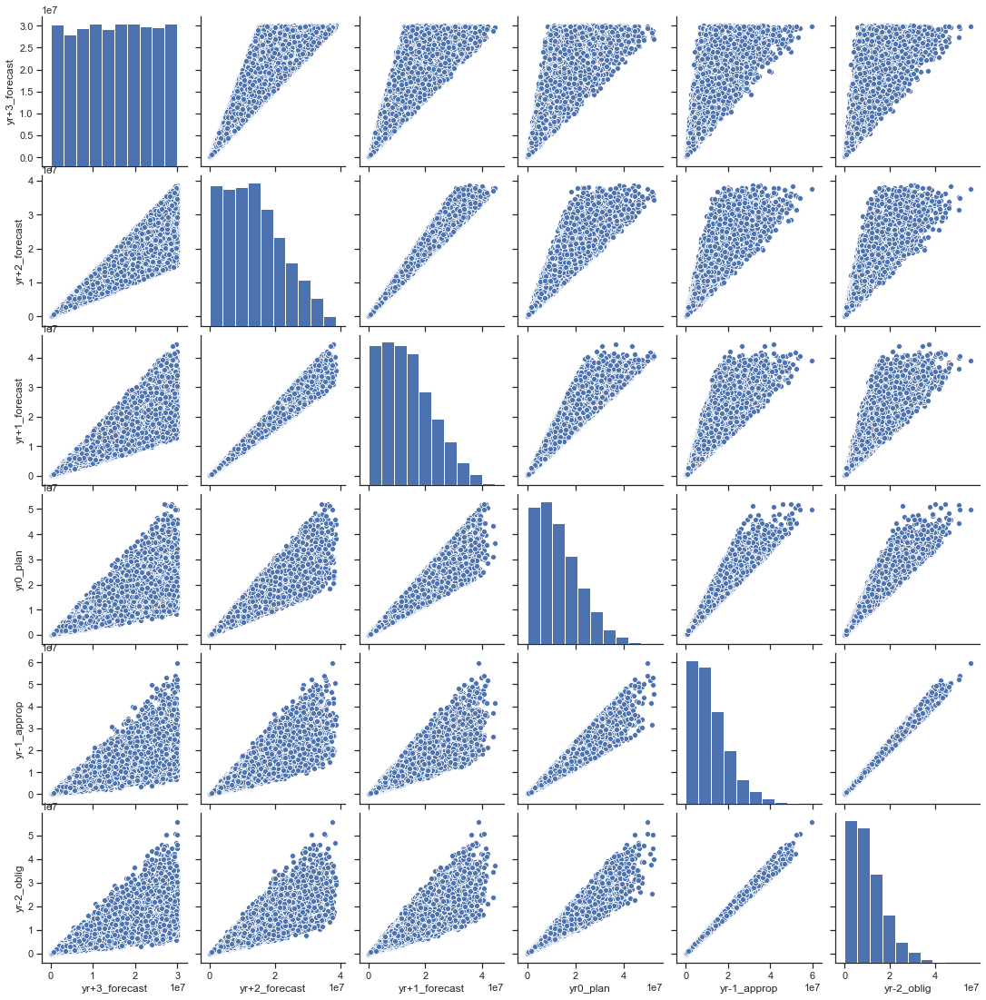

In [125]:
budget_pair = train_df[[
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']]
sns.set(style="ticks", color_codes=True)
sns.pairplot(budget_pair)

# PHASE 4: MODEL DEVELOPMENT

Convert dataframe to numpy arrays

In [126]:
x=dataset.iloc[:, 0:5].to_numpy()
y=dataset.iloc[:,5].to_numpy()
x

array([[22438798.  , 17892747.69, 20356185.96, 20931068.43, 19109162.11],
       [24942196.  , 17575309.75, 17438796.83, 18220947.2 , 17488764.33],
       [16909495.  ,  9447209.99,  7671825.14,  4824629.62,  4994584.87],
       ...,
       [26037497.  , 33449390.73, 37460188.81, 34371138.43, 36853130.17],
       [17727569.  , 10559915.85,  9084180.6 ,  9704387.49, 10200922.75],
       [ 4385383.  ,  5530287.06,  5850687.87,  7116684.49,  7650512.44]])

In [127]:
y=np.reshape(y, (-1,1))
y

array([[16702932.52],
       [14542194.06],
       [ 4457606.48],
       ...,
       [34236451.27],
       [ 8883617.64],
       [ 7195644.65]])

Scale the data from 0 -> 1

In [102]:
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()

print(scaler_x.fit(x))
xscale=scaler_x.transform(x)

print(scaler_y.fit(y))
yscale=scaler_y.transform(y)

MinMaxScaler(copy=True, feature_range=(0, 1))
MinMaxScaler(copy=True, feature_range=(0, 1))


Segregate master data to 'train', 'test', 'split'

In [103]:
X_train, X_test, y_train, y_test = train_test_split(xscale, yscale)

Verify the array shape

In [104]:
X_train.shape

(7500, 5)

y_train is the response variable

In [105]:
y_train.shape

(7500, 1)

### Build the recurrent neural network (RNN)

In [129]:
model = Sequential()
model.add(Dense(10, input_dim=5, kernel_initializer='normal', activation='relu'))
model.add(Dense(5, activation='relu'))
model.add(Dense(1, activation='linear'))
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 10)                60        
_________________________________________________________________
dense_10 (Dense)             (None, 5)                 55        
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 6         
Total params: 121
Trainable params: 121
Non-trainable params: 0
_________________________________________________________________


In [130]:
model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

### Fit the RNN model to our data

In [140]:
history = model.fit(X_train, y_train, epochs=200, batch_size=50,  verbose=1, validation_split=0.2)

Train on 6000 samples, validate on 1500 samples
Epoch 1/200
6000/6000 [==============================] - 0s 28us/sample - loss: 2.7520e-04 - mse: 2.7520e-04 - mae: 0.0116 - val_loss: 2.8870e-04 - val_mse: 2.8870e-04 - val_mae: 0.0117
Epoch 2/200
6000/6000 [==============================] - 0s 26us/sample - loss: 2.7137e-04 - mse: 2.7137e-04 - mae: 0.0115 - val_loss: 2.8976e-04 - val_mse: 2.8976e-04 - val_mae: 0.0119
Epoch 3/200
6000/6000 [==============================] - 0s 24us/sample - loss: 2.7353e-04 - mse: 2.7353e-04 - mae: 0.0115 - val_loss: 2.9315e-04 - val_mse: 2.9315e-04 - val_mae: 0.0119
Epoch 4/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.7185e-04 - mse: 2.7185e-04 - mae: 0.0115 - val_loss: 3.0550e-04 - val_mse: 3.0550e-04 - val_mae: 0.0123
Epoch 5/200
6000/6000 [==============================] - 0s 20us/sample - loss: 2.7564e-04 - mse: 2.7564e-04 - mae: 0.0116 - val_loss: 2.8918e-04 - val_mse: 2.8918e-04 - val_mae: 0.0117
Epoch 6/200
6000/6000 

6000/6000 [==============================] - 0s 25us/sample - loss: 2.7069e-04 - mse: 2.7069e-04 - mae: 0.0115 - val_loss: 2.9029e-04 - val_mse: 2.9029e-04 - val_mae: 0.0117
Epoch 45/200
6000/6000 [==============================] - 0s 21us/sample - loss: 2.7065e-04 - mse: 2.7065e-04 - mae: 0.0114 - val_loss: 2.9837e-04 - val_mse: 2.9837e-04 - val_mae: 0.0119
Epoch 46/200
6000/6000 [==============================] - 0s 20us/sample - loss: 2.7476e-04 - mse: 2.7476e-04 - mae: 0.0116 - val_loss: 3.2670e-04 - val_mse: 3.2670e-04 - val_mae: 0.0133
Epoch 47/200
6000/6000 [==============================] - 0s 18us/sample - loss: 2.7308e-04 - mse: 2.7308e-04 - mae: 0.0116 - val_loss: 2.9044e-04 - val_mse: 2.9044e-04 - val_mae: 0.0117
Epoch 48/200
6000/6000 [==============================] - 0s 21us/sample - loss: 2.7190e-04 - mse: 2.7190e-04 - mae: 0.0115 - val_loss: 2.9771e-04 - val_mse: 2.9771e-04 - val_mae: 0.0123
Epoch 49/200
6000/6000 [==============================] - 0s 20us/sample - los

Epoch 88/200
6000/6000 [==============================] - 0s 23us/sample - loss: 2.7183e-04 - mse: 2.7183e-04 - mae: 0.0115 - val_loss: 3.0278e-04 - val_mse: 3.0278e-04 - val_mae: 0.0122
Epoch 89/200
6000/6000 [==============================] - 0s 21us/sample - loss: 2.7543e-04 - mse: 2.7543e-04 - mae: 0.0115 - val_loss: 3.2825e-04 - val_mse: 3.2825e-04 - val_mae: 0.0125
Epoch 90/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.7825e-04 - mse: 2.7825e-04 - mae: 0.0117 - val_loss: 3.1175e-04 - val_mse: 3.1175e-04 - val_mae: 0.0121
Epoch 91/200
6000/6000 [==============================] - 0s 21us/sample - loss: 2.7228e-04 - mse: 2.7228e-04 - mae: 0.0114 - val_loss: 3.0247e-04 - val_mse: 3.0247e-04 - val_mae: 0.0122
Epoch 92/200
6000/6000 [==============================] - 0s 23us/sample - loss: 2.7614e-04 - mse: 2.7614e-04 - mae: 0.0116 - val_loss: 3.0242e-04 - val_mse: 3.0242e-04 - val_mae: 0.0121
Epoch 93/200
6000/6000 [==============================] - 0s 22us

Epoch 132/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.7620e-04 - mse: 2.7620e-04 - mae: 0.0116 - val_loss: 2.8998e-04 - val_mse: 2.8998e-04 - val_mae: 0.0117
Epoch 133/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.7961e-04 - mse: 2.7961e-04 - mae: 0.0117 - val_loss: 2.9900e-04 - val_mse: 2.9900e-04 - val_mae: 0.0121
Epoch 134/200
6000/6000 [==============================] - 0s 24us/sample - loss: 2.7025e-04 - mse: 2.7025e-04 - mae: 0.0115 - val_loss: 2.9314e-04 - val_mse: 2.9314e-04 - val_mae: 0.0120
Epoch 135/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.6983e-04 - mse: 2.6983e-04 - mae: 0.0114 - val_loss: 2.9310e-04 - val_mse: 2.9310e-04 - val_mae: 0.0121
Epoch 136/200
6000/6000 [==============================] - 0s 24us/sample - loss: 2.7288e-04 - mse: 2.7288e-04 - mae: 0.0115 - val_loss: 2.9042e-04 - val_mse: 2.9042e-04 - val_mae: 0.0118
Epoch 137/200
6000/6000 [==============================] - 0

6000/6000 [==============================] - 0s 23us/sample - loss: 2.6869e-04 - mse: 2.6869e-04 - mae: 0.0114 - val_loss: 2.9734e-04 - val_mse: 2.9734e-04 - val_mae: 0.0123
Epoch 176/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.7588e-04 - mse: 2.7588e-04 - mae: 0.0116 - val_loss: 2.9425e-04 - val_mse: 2.9425e-04 - val_mae: 0.0120
Epoch 177/200
6000/6000 [==============================] - 0s 23us/sample - loss: 2.7832e-04 - mse: 2.7832e-04 - mae: 0.0116 - val_loss: 2.9113e-04 - val_mse: 2.9113e-04 - val_mae: 0.0118
Epoch 178/200
6000/6000 [==============================] - 0s 22us/sample - loss: 2.7361e-04 - mse: 2.7361e-04 - mae: 0.0115 - val_loss: 2.9877e-04 - val_mse: 2.9877e-04 - val_mae: 0.0120
Epoch 179/200
6000/6000 [==============================] - 0s 23us/sample - loss: 2.7130e-04 - mse: 2.7130e-04 - mae: 0.0115 - val_loss: 2.9845e-04 - val_mse: 2.9845e-04 - val_mae: 0.0119
Epoch 180/200
6000/6000 [==============================] - 0s 21us/sample 

### Plot the Loss Test

In [141]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=history.history['loss'],
                    mode='lines',
                    name='Train'))
fig.add_trace(go.Scatter(y=history.history['val_loss'],
                    mode='lines+markers',
                    name='Validation'))
fig.update_layout(
    autosize=False,
    width=1500,
    height=750,
    title = "Train vs. Validation Loss Test",
    xaxis=dict(
        title_text="No. of epochs",
        titlefont=dict(size=20),
    ),


    yaxis=dict(
        title_text="Loss Value",
        titlefont=dict(size=20),
    )

)

fig.show()

## Predict Values

Create a new array with dummy data and test the model's effeftiveness against it

In [142]:
predict_full = init_array(25000)
valid_df = predict_full.iloc[:,:-1]
valid_df.tail(100)

,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp
24900,10764312,10054759.89,10349225.54,9486031.70,5947635.83
24901,7660234,5947814.29,6035319.47,6156034.20,6563980.48
24902,275119,296626.97,258673.28,237140.17,181518.75
24903,15761573,14974864.87,16939956.99,16927574.42,10593546.91
24904,25797948,22091922.53,23160845.29,19445510.31,13048680.81
...,...,...,...,...,...
24995,22335842,25959532.67,21530938.30,16530203.19,10561056.99
24996,23482597,24970070.00,21347316.96,19199604.47,19080248.74
24997,23094192,24686049.06,20783533.04,16490531.80,17473737.44
24998,24812089,14206547.98,16446017.41,16241400.06,13782445.74


Convert the dataframe to a two dimensional numpy array

In [143]:
valid_array = valid_df.to_numpy()
valid_array

array([[28776087.  , 24479091.55, 21179415.02, 26394639.98, 30541800.01],
       [ 7175845.  ,  4774818.85,  3926476.61,  2546470.54,  2376868.97],
       [26719203.  , 18765450.9 , 19158600.18, 23291639.43, 17442239.89],
       ...,
       [23094192.  , 24686049.06, 20783533.04, 16490531.8 , 17473737.44],
       [24812089.  , 14206547.98, 16446017.41, 16241400.06, 13782445.74],
       [14498714.  , 17187474.03, 17552896.33, 15073895.31, 16073237.52]])

Validate the shape of the newly created array

In [144]:
valid_array.shape

(25000, 5)

### Predict all response values for each of the 25,000 records

In [145]:
predict_val = model.predict(valid_array)
predict_val

array([[28950660. ],
       [ 2291683.8],
       [16843894. ],
       ...,
       [16786558. ],
       [13286091. ],
       [15422218. ]], dtype=float32)

Merge the numpy predictor array as a standalone column to the predict_full dataframe

In [146]:
predict_full['predict_values'] = predict_val
predict_full.tail(10)

,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,predict_values
24990,17846702,19737900.19,19374689.10,16049943.49,11699142.85,10564851.60,11242032.0
24991,8334738,6607681.19,5792812.26,4895196.12,3262139.55,2653116.60,3148995.5
24992,27469794,21180263.07,21335707.30,26373902.62,17900950.75,14615034.33,17296276.0
24993,27044778,22912206.18,23263464.55,18497527.59,19086464.86,18939770.95,18333280.0
24994,9092601,6654232.06,7735655.90,5140450.17,4579089.24,4211442.48,4392942.0
24995,22335842,25959532.67,21530938.30,16530203.19,10561056.99,9093586.81,10161777.0
24996,23482597,24970070.00,21347316.96,19199604.47,19080248.74,18571615.93,18346588.0
24997,23094192,24686049.06,20783533.04,16490531.80,17473737.44,16844910.24,16786558.0
24998,24812089,14206547.98,16446017.41,16241400.06,13782445.74,12133345.98,13286091.0
24999,14498714,17187474.03,17552896.33,15073895.31,16073237.52,13921083.72,15422218.0


Calculate the difference in actual ('yr0_exe') and predicted ('predict_values') model values and assign a difference value for each record in the 'delta' column

In [151]:
predict_full['delta'] = (predict_full['yr-2_oblig'] - predict_full['predict_values']) / predict_full['yr-2_oblig']
predict_full.tail(10)

,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,predict_values,delta
24990,17846702,19737900.19,19374689.10,16049943.49,11699142.85,10564851.60,11242032.0,-0.064097
24991,8334738,6607681.19,5792812.26,4895196.12,3262139.55,2653116.60,3148995.5,-0.186904
24992,27469794,21180263.07,21335707.30,26373902.62,17900950.75,14615034.33,17296276.0,-0.183458
24993,27044778,22912206.18,23263464.55,18497527.59,19086464.86,18939770.95,18333280.0,0.032022
24994,9092601,6654232.06,7735655.90,5140450.17,4579089.24,4211442.48,4392942.0,-0.043097
24995,22335842,25959532.67,21530938.30,16530203.19,10561056.99,9093586.81,10161777.0,-0.117466
24996,23482597,24970070.00,21347316.96,19199604.47,19080248.74,18571615.93,18346588.0,0.012117
24997,23094192,24686049.06,20783533.04,16490531.80,17473737.44,16844910.24,16786558.0,0.003464
24998,24812089,14206547.98,16446017.41,16241400.06,13782445.74,12133345.98,13286091.0,-0.095006
24999,14498714,17187474.03,17552896.33,15073895.31,16073237.52,13921083.72,15422218.0,-0.107832


Display the histogram of the delta values (i.e distribution)

In [152]:
fig = px.histogram(predict_full, x="delta",marginal="rug", # can be `box`, `violin`
                        hover_data=predict_full.columns, color_discrete_sequence=['indianred'], opacity = 0.5)
fig.update_layout(
    autosize=True,
    title = "Actual vs Prediction value Historgram ")
fig.show()

Display distribution of box & whisker plot for response and predict values

In [156]:
yr5 = dataset['yr-2_oblig']
yr6 = predict_full.predict_values

fig = go.Figure()
fig.add_trace(go.Box(x=yr5, name = "yr-2_oblig"))
fig.add_trace(go.Box(x=yr6, name = "predict_values"))
fig.show()

### Plot the model evaluation

Retrieve the statistical parameters for the linear model

In [157]:
x = predict_full['yr-2_oblig']
y = predict_full['predict_values']
slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
print(" Slope: {}\n Intercept: {}\n R-squared: {}\n P-Value: {}\n Standard Error: {}". format(slope, intercept, r_value, p_value, std_err))

 Slope: 1.0473031464015108
 Intercept: 186341.95780752227
 R-squared: 0.9942686711851848
 P-Value: 0.0
 Standard Error: 0.0007122550172855687


Plot the response values (original) against the predicted values

In [158]:
fig = px.scatter(predict_full, x="yr-2_oblig", y="predict_values", trendline="ols", opacity=0.25, color_discrete_sequence=['green'])
fig.update_layout(
    autosize=False,
    width=1000,
    height=750,
    title = "Response values vs predicted values scatterplot",
    xaxis=dict(
        title_text="yr-2_oblig values (Response Values)",
        titlefont=dict(size=20),
    ),


    yaxis=dict(
        title_text="predict_values (Predicted Values)",
        titlefont=dict(size=20),
    )

)
fig.show()

# GEOPLOT

In [ ]:
df_size = len(predict_full)
df_size

In [ ]:
lat_random = np.random.uniform(low=19.50139, high=64.85694, size=df_size)
long_random = np.random.uniform(low=-161.75583, high=-68.01197, size=df_size)

In [ ]:
len(long_random)

In [ ]:
geo_df = predict_full.copy()
geo_df['latitude'] = lat_random
geo_df['longitude'] = long_random
geo_df.tail(10)

In [ ]:
fig = px.scatter(geo_df[:50], x="longitude", y="latitude", opacity=0.25, size = "predict_values", color_discrete_sequence=['green'])
fig.update_layout(
    autosize=False,
    width=1000,
    height=750,
    title = "US Map of Budget points",
    xaxis=dict(
        title_text="Longitude",
        titlefont=dict(size=20),
    ),


    yaxis=dict(
        title_text="Latitude",
        titlefont=dict(size=20),
    )

)
fig.show()

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)


# PROGRAM END

In [ ]:
program_end = t.time() - program_start
elapsed = round(program_end, 2)

print("Total time for program execution is {} seconds".format(elapsed))

In [ ]:
import descartes
import geopandas gpd